In [1]:
import sys
import os
import yaml
import random
import argparse
import logging
import torch
import lightning.pytorch as pl
from lightning.pytorch.loggers import WandbLogger, CSVLogger, TensorBoardLogger
from lightning.pytorch.callbacks import (
    ModelCheckpoint,
    EarlyStopping,
)
from torchmdnet.module import LNNP
from torchmdnet import datasets, priors, models
from torchmdnet.data import DataModule
from torchmdnet.loss import loss_class_mapping
from torchmdnet.models import output_modules
from torchmdnet.models.model import create_prior_models
from torchmdnet.models.utils import rbf_class_mapping, act_class_mapping, dtype_mapping
from torchmdnet.utils import LoadFromFile, LoadFromCheckpoint, save_argparse, number
from lightning_utilities.core.rank_zero import rank_zero_warn
from torch.utils.data import ConcatDataset, Subset, SubsetRandomSampler, random_split

In [2]:
args = {
    "activation": "silu",
    "aggr": "add",
    "atom_filter": -1,
    "attn_activation": "silu",
    "batch_size": 1,
    "coord_files": None,
    "cutoff_lower": 0.0,
    "cutoff_upper": 5.0,
    "dataset": "MDCustomInMemory",
    "dataset_arg": {
        "root": "/Users/harrybadland/PycharmProjects/harry-torchmd/torchmd-net/examples/Butene-New/",
        "start": 1,
        "end": 6600,
    },
    "dataset_root": "~/data",
    "derivative": False,
    "distance_influence": "both",
    "early_stopping_patience": 300,
    "ema_alpha_neg_dy": 1.0,
    "ema_alpha_y": 0.05,
    "embed_files": None,
    "embedding_dimension": 128,
    "energy_files": None,
    "y_weight": 0.2,
    "force_files": None,
    "neg_dy_weight": 0.8,
    "load_model": None,
    "log_dir": "logs/",
    "lr": 0.001,
    "lr_factor": 0.8,
    "lr_min": 1.0e-07,
    "lr_patience": 30,
    "lr_warmup_steps": 1000,
    "max_num_neighbors": 32,
    "max_z": 100,
    "model": "equivariant-transformer",
    "neighbor_embedding": True,
    "ngpus": -1,
    "num_epochs": 3000,
    "num_heads": 8,
    "num_layers": 6,
    "num_nodes": 1,
    "num_rbf": 32,
    "num_workers": 6,
    "output_model": "Scalar",
    "precision": 32,
    "prior_model": None,
    "rbf_type": "expnorm",
    "redirect": False,
    "reduce_op": "add",
    "save_interval": 10,
    "splits": None,
    "standardize": True,
    "test_interval": 5,
    "test_size": 1299,
    "train_size": 1,
    "trainable_rbf": False,
    "val_size": 1,
    "weight_decay": 0.0,
    "box_vecs": None,
    "charge": False,
    "spin": False,
    "vector_cutoff": True,
    "wandb_use": True,
    "wandb_project": "MD17-Mix_No_Ethanol",
    "tensorboard_use": True,
    "wandb_name": "ET-Transformer-Mix_No_Ethanol",
    "pairwise_thread": True,
    "triples_thread": True,
    "return_vecs": True,
    "loop": True,
    "base_cutoff": 5.0,
    "outer_cutoff": 5.0,
    "gradient_clipping": 0.0,
    "remove_ref_energy": False,
    "train_loss": "mse_loss",
    "train_loss_arg": None,
    "seed": 1,
    "dataset_preload_limit": 1024,
    "lr_metric": "val",
    "box": None,
    "long_edge_index": True,
    "check_errors": True,
    "strategy": "brute",
    "include_transpose": True,
    "resize_to_fit": True,
    "output_mlp_num_layers": 0,
    "equivariance_invariance_group": "O(3)",
    "static_shapes": False,
    "wandb_resume_from_id": None,
    "inference_batch_size": 1,
}

args = argparse.Namespace(**args)

# Now you can access the arguments as attributes of the args object
print(args.activation)

silu


In [3]:
data = DataModule(args)
data.prepare_data()
data.setup("fit")

train 1, val 1, test 1299

computing mean and std: 100%|██████████| 1/1 [00:17<00:00, 17.40s/it]
/Users/harrybadland/PycharmProjects/harry-torchmd/torchmd-net/torchmdnet/data.py:363: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at /Users/runner/miniforge3/conda-bld/libtorch_1741947704867/work/aten/src/ATen/native/ReduceOps.cpp:1831.)
  self._std = ys.std(dim=0)


In [4]:
import numpy as np
import matplotlib.pyplot as plt

t = np.arange(256)
sp = np.fft.fft(np.sin(t))

freq = np.fft.fftfreq(t.shape[-1])

def make_fft_plot(timeseries, ax, label):
    freq = np.fft.fftfreq(timeseries.shape[-1])
    spectrum  = np.fft.fft(timeseries)
    ax.plot(freq, spectrum.real, label=f'real + {label}')
    ax.plot(freq, spectrum.imag, label=f'imag + {label}')

In [ ]:
energies = [float(data.dataset[i]["y"]) for i in range(len(data.dataset))]

In [21]:
energies = []
for i in range(len(data.dataset)):
    energies.append(float(data.dataset[i]["y"]))

KeyboardInterrupt: 

In [22]:
energies[0]

-15.939545631408691

In [5]:
prior_models = create_prior_models(vars(args), data.dataset)
args.prior_args = [p.get_init_args() for p in prior_models]
# initialize lightning module
model = LNNP(args, prior_model=prior_models, mean=data.mean, std=data.std)

In [6]:
trainer = pl.Trainer(
    strategy="auto",
    max_epochs=args.num_epochs,
    accelerator="cpu",
    # devices="cpu",
    num_nodes=args.num_nodes,
    default_root_dir=args.log_dir,
    # callbacks=[early_stopping, checkpoint_callback],
    # logger=_logger,
    precision=args.precision,
    gradient_clip_val=args.gradient_clipping,
    inference_mode=False,
    # Test-during-training requires reloading the dataloaders every epoch
    reload_dataloaders_every_n_epochs=1 if args.test_interval > 0 else 0,
)

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/harrybadland/miniconda3/envs/torchmd/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


In [8]:
model = LNNP.load_from_checkpoint("../logs/deepset_alkins/butene/20250414-234859/epoch=149-val_loss=0.0033-test_loss=0.0235.ckpt")
model.eval()

LNNP(
  (model): TorchMD_Net(
    (representation_model): DeepSet(
      (distance): OptimizedDistance()
      (distance_expansion): GaussianSmearing()
      (distance_proj): Linear(in_features=32, out_features=128, bias=True)
      (cutoff): CosineCutoff()
      (embedding): Embedding(100, 128)
      (neighbor_embedding): NeighborEmbedding(
        (embedding): Embedding(100, 128)
        (distance_proj): Linear(in_features=20, out_features=128, bias=True)
        (combine): Linear(in_features=256, out_features=128, bias=True)
        (cutoff): CosineCutoff()
      )
      (d_ij_transform): Linear(in_features=131, out_features=128, bias=True)
      (a_i_transform): Linear(in_features=128, out_features=128, bias=True)
      (a_j_transform): Linear(in_features=128, out_features=128, bias=True)
      (gamma_transform): Linear(in_features=384, out_features=128, bias=True)
      (experts): ModuleList(
        (0-9): 10 x Linear(in_features=128, out_features=128, bias=True)
      )
    )
  

In [9]:
from rich.progress import Progress, TextColumn, BarColumn, TimeRemainingColumn, MofNCompleteColumn

model.eval()
outputs_list = []
label_list = []

# Get total number of batches
total_batches = len(data.test_dataloader())

# Create progress bar
with Progress(
    TextColumn("[progress.description]{task.description}"),
    BarColumn(),
    MofNCompleteColumn(),
    TimeRemainingColumn(),
) as progress:
    
    # Add task
    task = progress.add_task("[cyan]Processing batches...", total=total_batches)
    
    # Inference loop
    with torch.no_grad():
        for batch in data.test_dataloader():
            # Get inputs and move to device
            z = batch.z.to(model.device)
            pos = batch.pos.to(model.device)
            batch_idx = batch.batch.to(model.device)
            y = batch.y

            # Forward pass
            outputs, _ = model.model(z, pos, batch=batch_idx)
            
            # Convert outputs to Python floats
            outputs_list.extend([x.item() for x in outputs])
            label_list.extend([x.item() for x in y])
            
            # Update progress
            progress.advance(task)

/Users/harrybadland/miniconda3/envs/torchmd/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

[W507 23:53:39.040763000 MPSFallback.mm:14] Warning: The operator 'torchmdnet_extensions::get_neighbor_pairs_fwd' is not currently supported on the MPS backend and will fall back to run on the CPU. This may have performance implications. (function operator())


The contribution for energy: tensor([[-1.5260],
        [-1.3832],
        [-3.2292],
        [ 0.9422],
        [-3.3638],
        [ 0.9978],
        [ 1.3787],
        [ 0.7337],
        [ 1.1277],
        [ 1.0624],
        [ 1.1841],
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]]

RecursionError: maximum recursion depth exceeded

In [12]:
import plotly.express as px

# Create a DataFrame for easier plotting
import pandas as pd

sub_outputs_list = outputs_list[:1000]
sub_label_list = label_list[:1000]
df = pd.DataFrame({
    'Index': range(len(sub_label_list)),
    'Outputs': sub_outputs_list,
    'Labels': sub_label_list,
    # "diff": [outputs_list[i] - label_list[i] for i in range(len(outputs_list))],
})

# Create a linear plot
fig = px.line(df, x='Index', y=['Outputs', 'Labels'], labels={'value': 'Values', 'variable': 'Legend'}, title='Outputs vs Labels, DeepSet')

# Show the plot
fig.show()

In [11]:
model = LNNP.load_from_checkpoint("logs/epoch=19-val_loss=0.0000-test_loss=0.0008.ckpt")
model.eval()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/harrybadland/PycharmProjects/harry-torchmd/torchmd-net/experiments/logs/epoch=19-val_loss=0.0000-test_loss=0.0008.ckpt'

In [13]:
from rich.progress import Progress, TextColumn, BarColumn, TimeRemainingColumn, MofNCompleteColumn

model.eval()
outputs_list = []
label_list = []

# Get total number of batches
total_batches = len(data.test_dataloader())

# Create progress bar
with Progress(
    TextColumn("[progress.description]{task.description}"),
    BarColumn(),
    MofNCompleteColumn(),
    TimeRemainingColumn(),
) as progress:
    
    # Add task
    task = progress.add_task("[cyan]Processing batches...", total=total_batches)
    
    # Inference loop
    with torch.no_grad():
        for batch in data.test_dataloader():
            # Get inputs and move to device
            z = batch.z.to(model.device)
            pos = batch.pos.to(model.device)
            batch_idx = batch.batch.to(model.device)
            y = batch.y

            # Forward pass
            outputs, _ = model.model(z, pos, batch=batch_idx)
            
            # Convert outputs to Python floats
            outputs_list.extend([x.item() for x in outputs])
            label_list.extend([x.item() for x in y])
            
            # Update progress
            progress.advance(task)

/Users/harrybadland/miniconda3/envs/torchmd/lib/python3.12/site-packages/rich/live.py:231: UserWarning:

install "ipywidgets" for Jupyter support

The contribution for energy: tensor([[-1.5260],
        [-1.3832],
        [-3.2292],
        [ 0.9422],
        [-3.3638],
        [ 0.9978],
        [ 1.3787],
        [ 0.7337],
        [ 1.1277],
        [ 1.0624],
        [ 1.1841],
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]], device='mps:0')
        [ 0.9468]]

RecursionError: maximum recursion depth exceeded

In [21]:
import plotly.express as px

# Create a DataFrame for easier plotting
import pandas as pd

sub_outputs_list = outputs_list[:1000]
sub_label_list = label_list[:1000]
df = pd.DataFrame({
    'Index': range(len(sub_label_list)),
    'Outputs': sub_outputs_list,
    'Labels': sub_label_list,
    # "diff": [outputs_list[i] - label_list[i] for i in range(len(outputs_list))],
})

# Create a linear plot
fig = px.line(df, x='Index', y=['Outputs', 'Labels'], labels={'value': 'Values', 'variable': 'Legend'}, title='Outputs vs Labels, Torch_MD')

# Show the plot
fig.show()

### Butene For DeepSet

In [31]:
import plotly.express as px

# Create a DataFrame for easier plotting
import pandas as pd

sub_outputs_list = outputs_list[:1000]
sub_label_list = label_list[:1000]
df = pd.DataFrame({
    'Index': range(len(sub_label_list)),
    'Outputs': sub_outputs_list,
    'Labels': sub_label_list,
    # "diff": [outputs_list[i] - label_list[i] for i in range(len(outputs_list))],
})

# Create a linear plot
fig = px.line(df, x='Index', y=['Outputs', 'Labels'], labels={'value': 'Values', 'variable': 'Legend'}, title='Outputs vs Labels')

# Show the plot
fig.show()

In [32]:
outputs.cpu()

tensor([[-12.6876]])

In [33]:
outputs_list

[-12.713857650756836,
 -12.74222183227539,
 -12.724385261535645,
 -12.724306106567383,
 -12.72500228881836,
 -12.708757400512695,
 -12.706513404846191,
 -12.714125633239746,
 -12.701972961425781,
 -12.716292381286621,
 -12.690096855163574,
 -12.716894149780273,
 -12.695366859436035,
 -12.674541473388672,
 -12.710958480834961,
 -12.686227798461914,
 -12.72746753692627,
 -12.71387004852295,
 -12.688714981079102,
 -12.707144737243652,
 -12.701472282409668,
 -12.697772026062012,
 -12.727286338806152,
 -12.720807075500488,
 -12.685848236083984,
 -12.695306777954102,
 -12.706073760986328,
 -12.711440086364746,
 -12.708670616149902,
 -12.699831008911133,
 -12.712903022766113,
 -12.715995788574219,
 -12.710150718688965,
 -12.701515197753906,
 -12.699077606201172,
 -12.725972175598145,
 -12.710784912109375,
 -12.698661804199219,
 -12.696556091308594,
 -12.720998764038086,
 -12.685988426208496,
 -12.710920333862305,
 -12.703618049621582,
 -12.73100471496582,
 -12.684488296508789,
 -12.7385864257

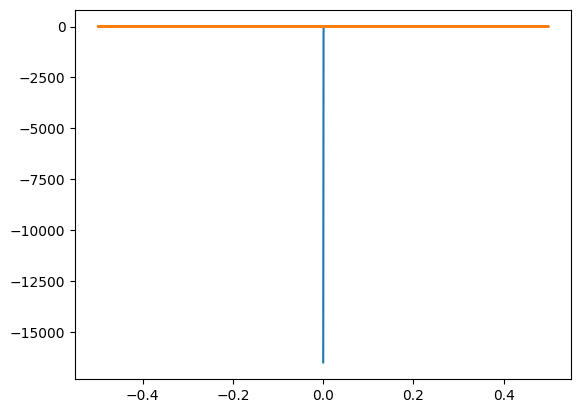

In [34]:
fig, ax = plt.subplots()
make_fft_plot(np.array(outputs_list), ax, 'outputs')

In [48]:
outputs_list = np.array(outputs_list)
outputs_list = outputs_list - outputs_list.mean()

In [49]:
np.fft.fft(np.array(outputs_list))

array([ 3.63861719e-13+0.j        , -8.25401043e-04+0.39381559j,
        9.53536257e-02-0.25383651j, ..., -7.69177720e-01-0.23982633j,
        9.53536257e-02+0.25383651j, -8.25401043e-04-0.39381559j])

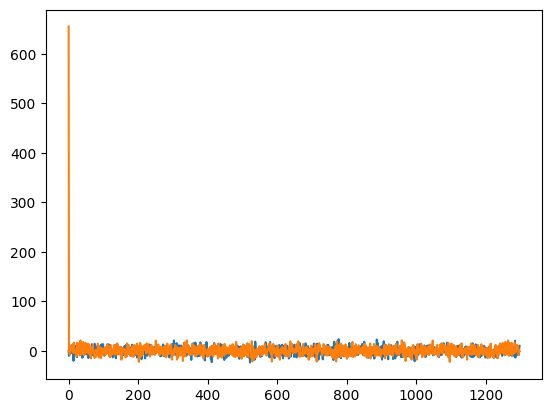

In [55]:
plt.plot(np.arange(outputs_list.shape[-1]), np.round(np.fft.fft(np.array(np.random.random(size=outputs_list.shape[-1]))).imag, 4))
plt.plot(np.arange(outputs_list.shape[-1]), np.round(np.fft.fft(np.array(np.random.random(size=outputs_list.shape[-1]))).real, 4))

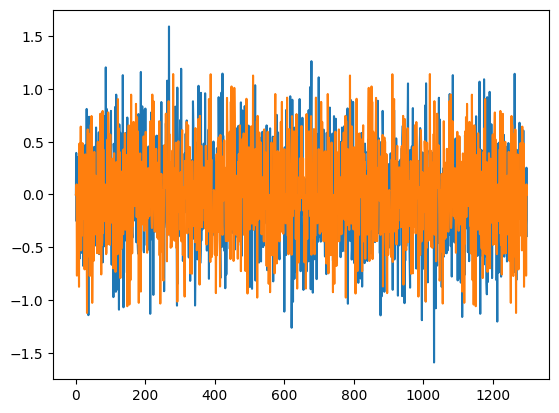

In [116]:
plt.plot(np.arange(outputs_list.shape[-1]), np.round(np.fft.fft(np.array(outputs_list)).imag, 4))
plt.plot(np.arange(outputs_list.shape[-1]), np.round(np.fft.fft(np.array(outputs_list)).real, 4))

In [78]:

def plot_fourier(ax, outputs_list):
    ax.plot(np.arange(outputs_list.shape[-1]), np.fft.fft(np.array(outputs_list)).imag)
    ax.plot(np.arange(outputs_list.shape[-1]), np.fft.fft(np.array(outputs_list)).real)

In [47]:
outputs_list

[-12.713857650756836,
 -12.74222183227539,
 -12.724385261535645,
 -12.724306106567383,
 -12.72500228881836,
 -12.708757400512695,
 -12.706513404846191,
 -12.714125633239746,
 -12.701972961425781,
 -12.716292381286621,
 -12.690096855163574,
 -12.716894149780273,
 -12.695366859436035,
 -12.674541473388672,
 -12.710958480834961,
 -12.686227798461914,
 -12.72746753692627,
 -12.71387004852295,
 -12.688714981079102,
 -12.707144737243652,
 -12.701472282409668,
 -12.697772026062012,
 -12.727286338806152,
 -12.720807075500488,
 -12.685848236083984,
 -12.695306777954102,
 -12.706073760986328,
 -12.711440086364746,
 -12.708670616149902,
 -12.699831008911133,
 -12.712903022766113,
 -12.715995788574219,
 -12.710150718688965,
 -12.701515197753906,
 -12.699077606201172,
 -12.725972175598145,
 -12.710784912109375,
 -12.698661804199219,
 -12.696556091308594,
 -12.720998764038086,
 -12.685988426208496,
 -12.710920333862305,
 -12.703618049621582,
 -12.73100471496582,
 -12.684488296508789,
 -12.7385864257

In [19]:
outputs_list

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan

In [14]:
from torchmetrics import MeanAbsoluteError

# Create the metric
mae = MeanAbsoluteError()

# Compute the metric
mae(torch.tensor(outputs_list), torch.tensor(label_list))

# Print the result
mae.compute()



tensor(0.0206)

### Butene Part for ET

In [8]:
import plotly.express as px

# Create a DataFrame for easier plotting
import pandas as pd

sub_outputs_list = outputs_list[:1000]
sub_label_list = label_list[:1000]
df = pd.DataFrame({
    'Index': range(len(sub_label_list)),
    'Outputs': sub_outputs_list,
    'Labels': sub_label_list,
    # "diff": [outputs_list[i] - label_list[i] for i in range(len(outputs_list))],
})

# Create a linear plot
fig = px.line(df, x='Index', y=['Outputs', 'Labels'], labels={'value': 'Values', 'variable': 'Legend'}, title='Outputs vs Labels')

# Show the plotء٬س۰
fig.show()

In [9]:
from torchmetrics import MeanAbsoluteError

# Create the metric
mae = MeanAbsoluteError()

# Compute the metric
mae(torch.tensor(outputs_list), torch.tensor(label_list))

# Print the result
mae.compute()



tensor(0.0191)

#### Load Butene dataset

In [100]:
args = {
    "activation": "silu",
    "aggr": "add",
    "atom_filter": -1,
    "attn_activation": "silu",
    "batch_size": 1,
    "coord_files": None,
    "cutoff_lower": 0.0,
    "cutoff_upper": 5.0,
    "dataset": "MD17",
    "dataset_arg": {
        "molecules": "aspirin"
    },
    "dataset_root": "~/data",
    "derivative": False,
    "distance_influence": "both",
    "early_stopping_patience": 300,
    "ema_alpha_neg_dy": 1.0,
    "ema_alpha_y": 0.05,
    "embed_files": None,
    "embedding_dimension": 128,
    "energy_files": None,
    "y_weight": 0.2,
    "force_files": None,
    "neg_dy_weight": 0.8,
    "load_model": None,
    "log_dir": "logs/",
    "lr": 0.001,
    "lr_factor": 0.8,
    "lr_min": 1.0e-07,
    "lr_patience": 30,
    "lr_warmup_steps": 1000,
    "max_num_neighbors": 32,
    "max_z": 100,
    "model": "equivariant-transformer",
    "neighbor_embedding": True,
    "ngpus": -1,
    "num_epochs": 3000,
    "num_heads": 8,
    "num_layers": 6,
    "num_nodes": 1,
    "num_rbf": 32,
    "num_workers": 6,
    "output_model": "Scalar",
    "precision": 32,
    "prior_model": None,
    "rbf_type": "expnorm",
    "redirect": False,
    "reduce_op": "add",
    "save_interval": 10,
    "splits": None,
    "standardize": True,
    "test_interval": 5,
    "test_size": 1299,
    "train_size": 1,
    "trainable_rbf": False,
    "val_size": 1,
    "weight_decay": 0.0,
    "box_vecs": None,
    "charge": False,
    "spin": False,
    "vector_cutoff": True,
    "wandb_use": True,
    "wandb_project": "MD17-Mix_No_Ethanol",
    "tensorboard_use": True,
    "wandb_name": "ET-Transformer-Mix_No_Ethanol",
    "pairwise_thread": True,
    "triples_thread": True,
    "return_vecs": True,
    "loop": True,
    "base_cutoff": 5.0,
    "outer_cutoff": 5.0,
    "gradient_clipping": 0.0,
    "remove_ref_energy": False,
    "train_loss": "mse_loss",
    "train_loss_arg": None,
    "seed": 1,
    "dataset_preload_limit": 1024,
    "lr_metric": "val",
    "box": None,
    "long_edge_index": True,
    "check_errors": True,
    "strategy": "brute",
    "include_transpose": True,
    "resize_to_fit": True,
    "output_mlp_num_layers": 0,
    "equivariance_invariance_group": "O(3)",
    "static_shapes": False,
    "wandb_resume_from_id": None,
    "inference_batch_size": 1,
}

argparse_args = argparse.Namespace(**args)

# Now you can access the arguments as attributes of the args object
print(argparse_args.activation)

silu


In [101]:
data = DataModule(argparse_args)
data.prepare_data()
data.setup("fit")

/home/amir/Projects/torchmd-net/torchmdnet/datasets/md17.py:84: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.

/home/amir/Projects/torchmd-net/torchmdnet/utils.py:221: UserWa

train 1, val 1, test 1299

computing mean and std: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]
/home/amir/Projects/torchmd-net/torchmdnet/data.py:355: UserWarning:

std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at /home/conda/feedstock_root/build_artifacts/libtorch_1730840128166/work/aten/src/ATen/native/ReduceOps.cpp:1823.)



In [85]:
energies = [float(data.dataset[i]["y"]) for i in range(len(data.dataset))]

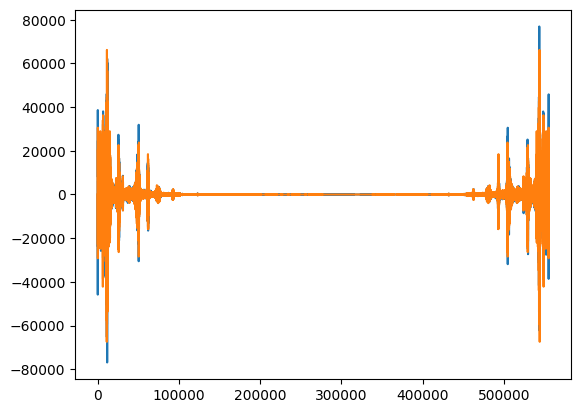

In [81]:
fig, ax = plt.subplots()

plot_fourier(ax, np.array(energies)- np.array(energies).mean())

In [ ]:
energies = [float(data.dataset[i]["y"]) for i in range(len(data.dataset))]

Text(0.5, 1.0, 'asdas')

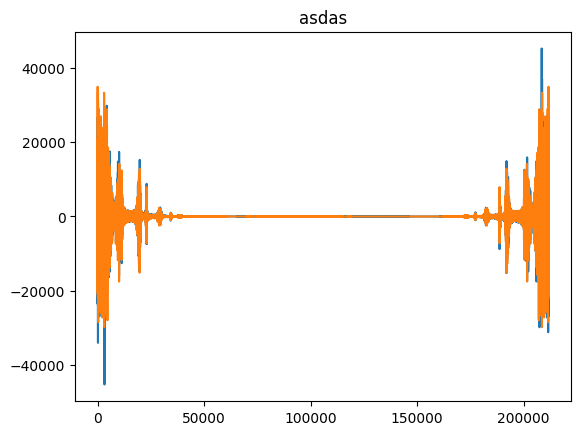

In [91]:
fig, ax = plt.subplots()

plot_fourier(ax, np.array(energies)- np.array(energies).mean())
ax.set_title("asdas")

In [109]:
args["dataset_arg"] = {
    "molecules": "ethanol"
}
argparse_args = argparse.Namespace(**args)
data = DataModule(argparse_args)
data.prepare_data()
data.setup("fit")


/home/amir/Projects/torchmd-net/torchmdnet/datasets/md17.py:84: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.

/home/amir/Projects/torchmd-net/torchmdnet/utils.py:221: UserWa

train 1, val 1, test 1299

computing mean and std: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]
/home/amir/Projects/torchmd-net/torchmdnet/data.py:355: UserWarning:

std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at /home/conda/feedstock_root/build_artifacts/libtorch_1730840128166/work/aten/src/ATen/native/ReduceOps.cpp:1823.)



In [115]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame({
    'x': range(len(energies)),
    'energies': np.array(energies)
}
)

px.line(df, x=['x'], y='energies')